In [262]:
# import mitsuba
import math

from scipy import constants as const

# import drjit
import drjit as dr
import matplotlib.pyplot as plt
import numpy as np

import mitsuba as mi

# colocar el valor de spectral
mi.set_variant("cuda_ad_spectral")

from mitsuba import ScalarTransform4f as T


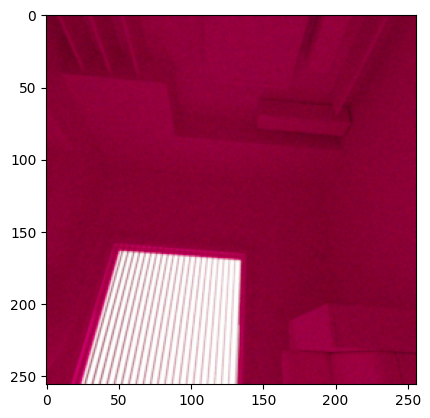

In [263]:
result_path = "../output/static/result/"
static = "../output/static/"

img = plt.imread(result_path + "rgb.png")
plt.imshow(img)
plt.show()

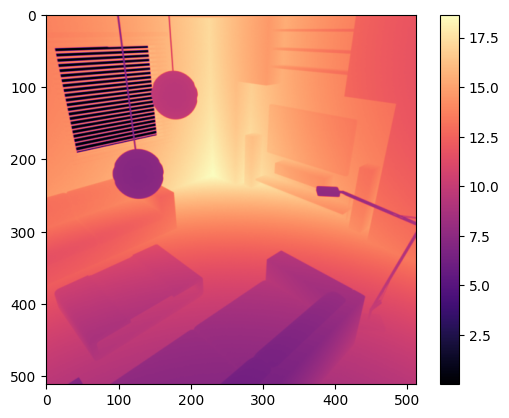

In [264]:
depth = np.load(result_path + "depth.npy")
plt.imshow(depth, cmap='magma')
plt.colorbar()

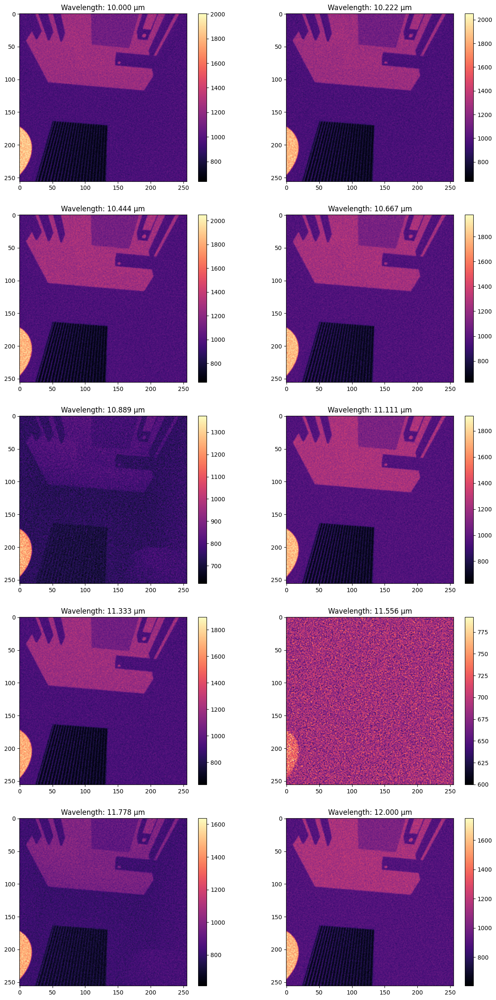

In [265]:
wavelengths = np.linspace(10, 12,10, endpoint=True)
thermal = np.load(result_path + "thermal.npy")

plt.figure(figsize=(15, 30))

for i, wl in enumerate(wavelengths):

    plt.subplot(5, 2, i + 1)
    plt.title(f"Wavelength: {wl:.3f} μm")
    plt.imshow(thermal[:, :, i], cmap='magma')
    plt.colorbar()
plt.show()


Text(0, 0.5, 'Spectral Radiance (μW/cm²/sr/μm)')

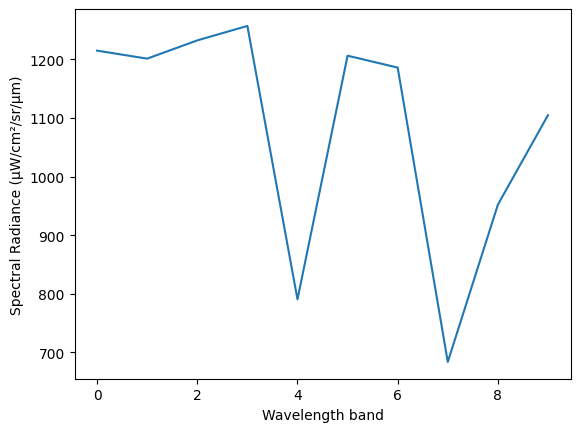

In [266]:
plt.plot(thermal[100, 100, :])
plt.xlabel("Wavelength band")
plt.ylabel("Spectral Radiance (μW/cm²/sr/μm)")

(256, 256, 10)


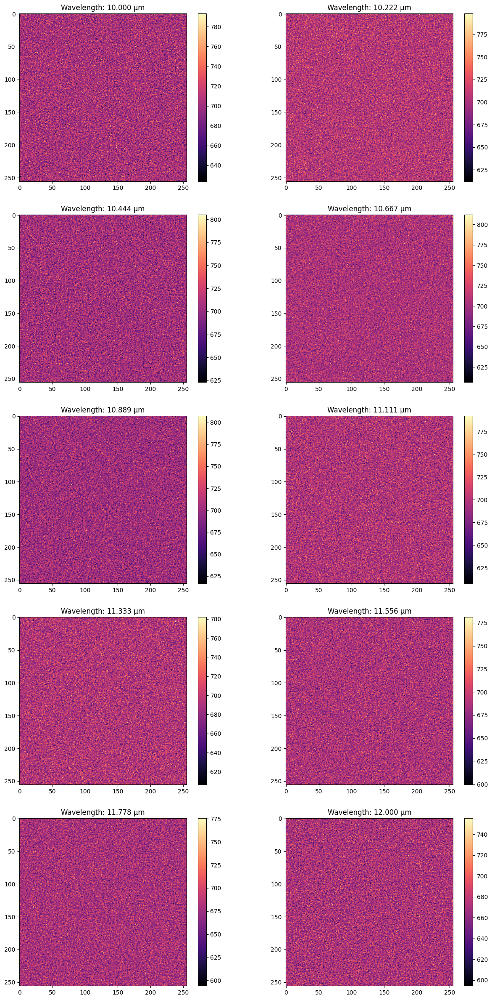

In [267]:
b_air = np.load(result_path + "blackbody_air.npy")

print(b_air.shape)

plt.figure(figsize=(15, 30))
for i, wl in enumerate(wavelengths):

    plt.subplot(5, 2, i + 1)
    plt.title(f"Wavelength: {wl:.3f} μm")
    plt.imshow(b_air[:, :, i], cmap='magma')
    plt.colorbar()
plt.show()


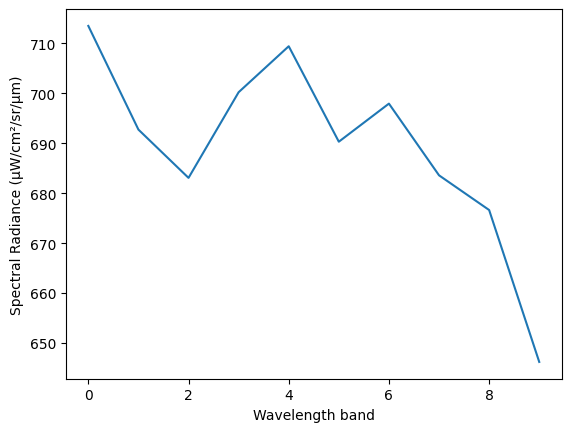

In [268]:
plt.plot(b_air[100, 100, :])
plt.xlabel("Wavelength band")
plt.ylabel("Spectral Radiance (μW/cm²/sr/μm)")
plt.show()

(256, 256, 10)


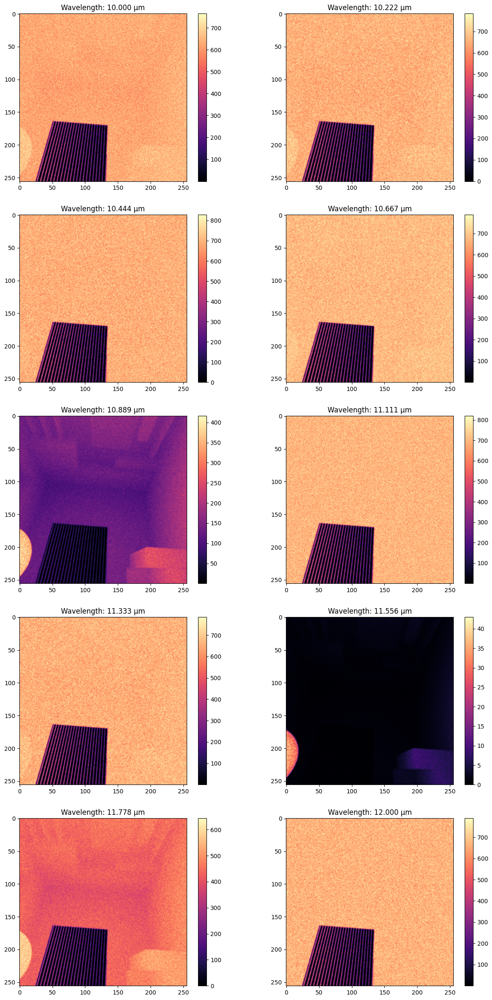

In [269]:
t_b_air = np.load(result_path + "transmittance_blackbody_air.npy")

print(t_b_air.shape)

plt.figure(figsize=(15, 30))
for i, wl in enumerate(wavelengths):

    plt.subplot(5, 2, i + 1)
    plt.title(f"Wavelength: {wl:.3f} μm")
    plt.imshow(t_b_air[:, :, i], cmap='magma')
    plt.colorbar()
plt.show()


(256, 256, 10)


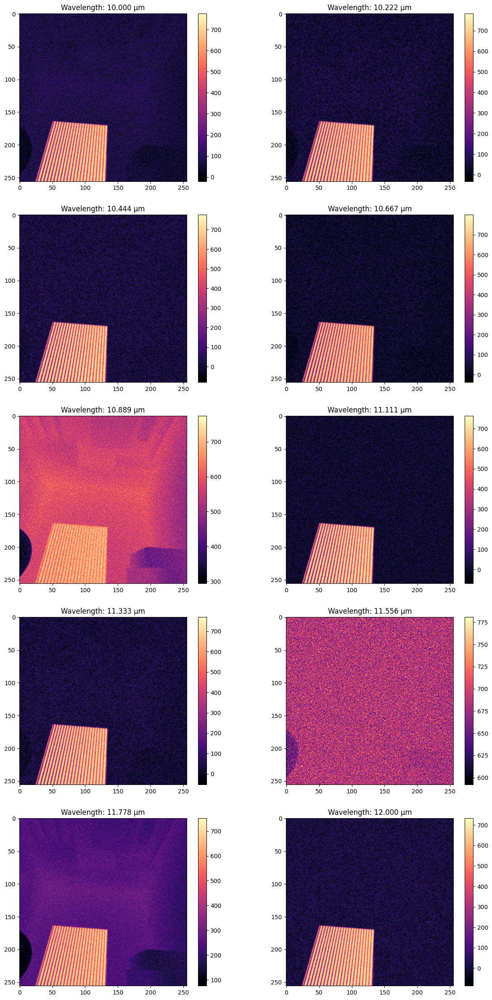

In [270]:
contribution_air = np.load(result_path + "contribution_blackbody_air.npy")

print(contribution_air.shape)
plt.figure(figsize=(15, 30))
for i, wl in enumerate(wavelengths):
    
    plt.subplot(5, 2, i + 1)
    plt.title(f"Wavelength: {wl:.3f} μm")
    plt.imshow(contribution_air[:, :, i], cmap='magma')
    plt.colorbar()
plt.show()


min2 0.0002635732
(512, 512)


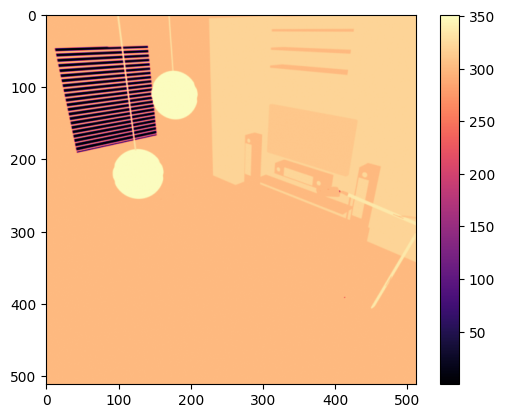

In [271]:
tmap = np.load(result_path + "temperature_map.npy")

tmap_flat = tmap.flatten()

min2 = np.partition(tmap_flat, 1)[1]
print("min2", min2)

print(tmap.shape)
plt.imshow(tmap, cmap='magma')
plt.colorbar()

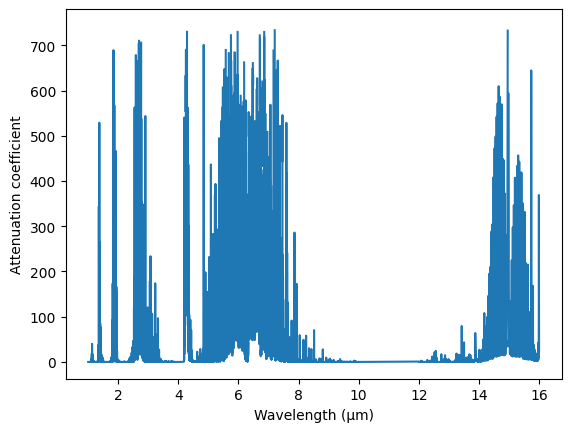

In [272]:
attenuation_air = np.loadtxt(static + "air.txt")

wavelengths = attenuation_air[:, 0]
attenuation = attenuation_air[:, 1].copy()

# Aumentar la atenuación entre 10 y 12 μm hasta un máximo de 2
mask = (wavelengths >= 10) & (wavelengths <= 12)
attenuation[mask] = np.linspace(0, 0.8, mask.sum())

plt.plot(wavelengths, attenuation)
plt.xlabel("Wavelength (μm)")
plt.ylabel("Attenuation coefficient")
plt.xlim()

np.savetxt(static + "air_modificado.txt", np.column_stack((wavelengths, attenuation)), delimiter='\t')